In [27]:
from functools import partial

import torch
import torch.nn as nn
import torch.nn.functional as F

from mynam.models.nam import NAM 
from mynam.trainer.wandbtrainer import *
from mynam.config.default import defaults
from mynam.data.toydataset import ToyDataset
from mynam.data.gamdataset import GAMDataset
from mynam.data.generator import *
from mynam.utils.wandb import *
from mynam.utils.plotting import *

import matplotlib.pyplot as plt 
import numpy as np

import wandb 
"""
@misc{kayid2020nams,
  title={Neural additive models Library},
  author={Kayid, Amr and Frosst, Nicholas and Hinton, Geoffrey E},
  year={2020}
}
"""

'\n@misc{kayid2020nams,\n  title={Neural additive models Library},\n  author={Kayid, Amr and Frosst, Nicholas and Hinton, Geoffrey E},\n  year={2020}\n}\n'

In [2]:
%reload_ext autoreload 
%autoreload 2

In [24]:
#wandb.login()
wandb.finish() # mark runs as finished before starting new runs
cfg = defaults()

# Set up synthetic toy dataset 

In [4]:
load_data = True

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: xinyu-zhang. Use `wandb login --relogin` to force relogin


wandb:   3 of 3 files downloaded.  


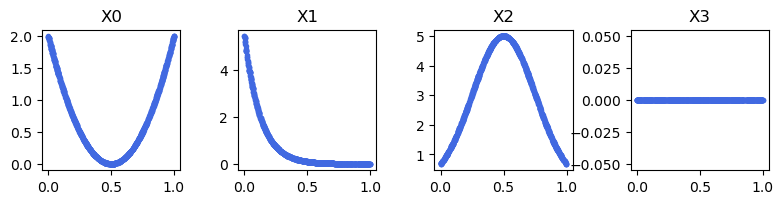

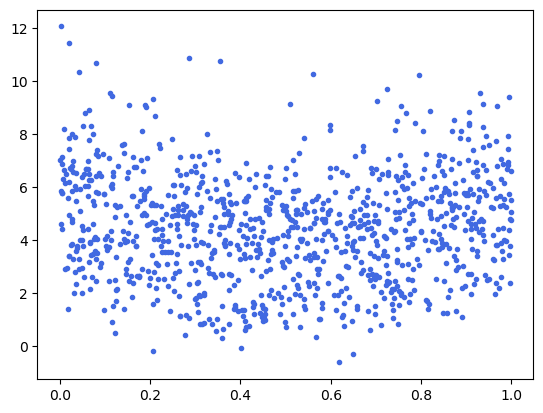

In [5]:

if load_data:
    # fetch data and construct dataset from W&B
    processed_datasets = preprocess_and_log(project_name='LANAM-grid-basic-synthetic', job_type='dataset', artifact_or_name='synthetic-4:v0')
    trainset = processed_datasets['training']
    valset = processed_datasets['validation']
    testset = processed_datasets['test']
else:
    # construct dataset from scratch
    gen_funcs, gen_func_names = task()
    in_features = len(gen_funcs)
    sigma = cfg.prior_sigma_noise
    print(sigma)
    trainset = ToyDataset(gen_funcs, gen_func_names, num_samples=1000, sigma=sigma)
    valset = ToyDataset(gen_funcs, gen_func_names, num_samples=200, sigma=sigma)
    testset = ToyDataset(gen_funcs, gen_func_names, num_samples=50, use_test=True)
    
trainset.plot()
train_loader, train_loader_fnn = trainset.loader, trainset.loader_fnn
val_loader, val_loader_fnn = valset.loader, valset.loader_fnn
X_test, y_test = testset.X, testset.y

In [ ]:
train(cfg, train_loader, val_loader, testset, ensemble=True, use_wandb=False)

# W&B

In [25]:
# note that non-iterative type is invalid for wandb parameters_list
# note that log_uniform will add base exponents;
# while log_uniform_values expects specified values. 
"""
parameters_list = {
    'lr': {
        'distribution': 'log_uniform_values',
        'min': 1e-2, 
        'max': 1e-3, 
    }, 
    'output_regularization': {
        'distribution': 'log_uniform_values',
        'min': 1e-3, 
        'max': 1e-1, 
    }, 
    'l2_regularization': {
        'distribution': 'log_uniform_values',
        'min': 1e-6, 
        'max': 1e-4, 
    }, 
    'dropout':  {
        'values': [0, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    }, 
    'feature_dropout': {
        'values': [0, 0.05, 0.1, 0.2]
    }, 
    'activation':  {
        'values': ['gelu', 'relu', 'leakyrelu', 'elu', 'exu']
    }, 
    
}"""
parameters_list = {
    'lr': {
        'values': [0.01, 0.001]
    }, 
    'output_regularization': {
        'values': [0.1, 0.01]
    }, 
    'dropout':  {
        'values': [0, 0.05]
    }, 
    'feature_dropout': {
        'values': [0, 0.05]
    }, 
    'activation':  {
        'values': ['exu']
    }, 
    'num_basis_functions': {
        'values': [64, 1024]
    },
    
}
sweep_configuration = {
    'method': 'grid', 
    'name': 'sweep',
    'metric': {
        'goal': 'minimize', 
        'name': 'val_MAE', 
    }, 
    'parameters': parameters_list
}
# initialize the sweep 
sweep_id = wandb.sweep(
    sweep=sweep_configuration, 
    project='NAM-grid-basic-synthetic-3.0'
)

print(f"sweep id: {sweep_id}")

Create sweep with ID: kf5iake8
Sweep URL: https://wandb.ai/xinyu-zhang/NAM-grid-basic-synthetic-3.0/sweeps/kf5iake8
sweep id: kf5iake8


wandb: Agent Starting Run: 2nzlui8j with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▇▄▄▁
Train_Loss,█▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▅▅▃▃▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▁▁▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▅▅▄▄▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.39313
Train_Loss,1.07618
Train_MSE,0.91343
Val_Loss,1.01829
Val_MSE,0.88199


wandb: Agent Starting Run: hbrc384u with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▆▂▄▁
Train_Loss,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▄▄▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▅▄▄▄▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.40861
Train_Loss,0.93549
Train_MSE,0.88054
Val_Loss,0.87083
Val_MSE,0.81962


wandb: Agent Starting Run: tjzn17sf with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)
/scratch/work/zhangx18/reproduced-nam/mynam/utils/plotting.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_indiv, axs = plt.subplots(rows, cols, figsize=figsize)


Finished Training.


Output_std_mean,▅▃▁▃█
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.81
Train_Loss,2.14008
Train_MSE,1.87747
Val_Loss,2.03072
Val_MSE,1.79022


wandb: Agent Starting Run: 7pi9ddvg with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▇▁▃█▆
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.72412
Train_Loss,1.81901
Train_MSE,1.74276
Val_Loss,1.55433
Val_MSE,1.48025


wandb: Agent Starting Run: f2x0ywl2 with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▄▆██
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▄▃▃▄▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂▂▁▂▂▂▂▂▁▂▂▁▂▁▁▁▁▁
Val_MSE,█▄▃▃▄▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂▂▁▂▂▂▂▂▁▂▂▁▂▁▁▁▁▁
Output_std_mean,0.61916
Train_Loss,2.57063
Train_MSE,2.25014
Val_Loss,3.0939
Val_MSE,2.76738


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 4f2r17db with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▃█▁▃▂
Train_Loss,█▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▄▃▃▄▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▂▁▁▁▂▁▂▂▁▁▂▁▁▂▁▁▁▁▁
Val_MSE,█▄▃▃▄▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▂▁▁▁▂▁▂▂▁▁▂▁▁▂▁▁▁▁▁
Output_std_mean,0.59137
Train_Loss,2.25519
Train_MSE,2.17961
Val_Loss,2.84403
Val_MSE,2.76592


wandb: Agent Starting Run: bnvgky4x with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▆█▆▂▁
Train_Loss,█▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Val_Loss,█▄▅▅▄▅▄▄▄▄▄▄▄▄▄▃▄▃▄▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Val_MSE,█▄▅▅▄▄▄▄▄▄▄▄▃▄▄▃▄▃▄▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Output_std_mean,0.45313
Train_Loss,1.81306
Train_MSE,1.46014
Val_Loss,1.8446
Val_MSE,1.47998


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: bbcr7s9u with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▇█▄▂▁
Train_Loss,█▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁
Val_Loss,█▄▄▄▄▄▄▄▃▄▃▄▃▃▄▃▃▃▄▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Val_MSE,█▄▄▄▄▄▄▄▃▄▃▄▃▃▄▃▃▃▄▃▃▂▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Output_std_mean,0.56528
Train_Loss,1.70263
Train_MSE,1.61249
Val_Loss,1.6919
Val_MSE,1.60083


wandb: Agent Starting Run: gfxxhc18 with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,██▂▁▁
Train_Loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▂▁▂▂▂▁▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁
Val_MSE,█▅▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▂▁▂▂▂▁▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁
Output_std_mean,0.41928
Train_Loss,1.3529
Train_MSE,1.26141
Val_Loss,1.27723
Val_MSE,1.18483


wandb: Agent Starting Run: u1ok800h with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,██▂▁▁
Train_Loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▂▁▂▂▁▁▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁
Val_MSE,█▅▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▂▂▁▁▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁
Output_std_mean,0.41615
Train_Loss,1.24424
Train_MSE,1.23298
Val_Loss,1.12135
Val_MSE,1.11039


wandb: Agent Starting Run: fs44v2rf with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▄▁▃▆
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.68775
Train_Loss,2.24846
Train_MSE,2.10227
Val_Loss,1.82374
Val_MSE,1.68893


wandb: Agent Starting Run: w5m0onln with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▄▁▄▆
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.71967
Train_Loss,2.21245
Train_MSE,2.19466
Val_Loss,1.70391
Val_MSE,1.68778


wandb: Agent Starting Run: i570ka4s with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▆█▇▇
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▄▃▄▃▄▃▂▃▄▂▃▃▂▂▃▂▂▂▂▂▃▂▁▂▁▂▁▂▂▂▁▁▂▁▁▁▁▁▁
Val_MSE,█▄▃▄▃▄▃▂▃▃▂▃▂▂▂▃▂▂▂▂▂▃▂▁▂▁▂▁▂▂▂▁▁▂▁▁▁▁▁▁
Output_std_mean,0.59323
Train_Loss,2.96287
Train_MSE,2.78096
Val_Loss,3.06876
Val_MSE,2.89205


wandb: Agent Starting Run: d53hlajh with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▅█▇▇
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▄▃▄▃▃▃▂▃▃▂▃▂▂▂▃▂▂▂▂▂▃▂▁▂▁▁▁▂▂▂▁▁▂▁▁▁▁▁▁
Val_MSE,█▄▃▄▃▃▃▂▃▃▂▃▂▂▂▃▂▂▂▂▂▃▂▁▂▁▁▁▂▂▂▁▁▂▁▁▁▁▁▁
Output_std_mean,0.61031
Train_Loss,2.84471
Train_MSE,2.82225
Val_Loss,2.87235
Val_MSE,2.8506


wandb: Agent Starting Run: 781m9brf with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▇▅▅▁
Train_Loss,█▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▆▅▇▆▄▅▄▅▅▆▄▅▄▄▅▄▄▄▄▃▄▃▄▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁
Val_MSE,█▆▆▅▇▆▄▅▄▅▅▆▄▅▅▄▅▄▄▄▄▃▄▃▄▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁
Output_std_mean,0.41803
Train_Loss,2.06536
Train_MSE,1.8481
Val_Loss,1.71412
Val_MSE,1.52868


wandb: Agent Starting Run: cplouvtm with config:
wandb: 	activation: exu
wandb: 	dropout: 0
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▇▄▄▁
Train_Loss,█▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▅▅▇▅▄▅▄▅▅▆▄▅▄▄▅▄▃▄▄▃▄▃▄▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁
Val_MSE,█▆▅▅▇▅▄▅▄▅▅▆▄▅▄▄▅▄▃▄▄▃▄▃▄▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁
Output_std_mean,0.43029
Train_Loss,2.0436
Train_MSE,2.01311
Val_Loss,1.62771
Val_MSE,1.60142


wandb: Agent Starting Run: 7lu98h63 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▇▂▄▁
Train_Loss,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▆▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▆▆▄▃▃▂▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.44771
Train_Loss,1.34878
Train_MSE,1.25657
Val_Loss,1.30479
Val_MSE,1.20833


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ts13sfl4 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▆▁▃▃
Train_Loss,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▆▄▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▆▆▄▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.48651
Train_Loss,1.35134
Train_MSE,1.34012
Val_Loss,1.27882
Val_MSE,1.26734


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: g044rta4 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▄▁█▄█
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,1.02312
Train_Loss,2.41374
Train_MSE,2.26463
Val_Loss,2.42566
Val_MSE,2.26704


wandb: Agent Starting Run: 6u0s07tn with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▄▁▇▄█
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,1.05311
Train_Loss,2.32755
Train_MSE,2.30968
Val_Loss,2.2614
Val_MSE,2.24169


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: i3s0q74w with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▆█▇▇
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▄▃▂▂▂▃▃▃▃▂▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▁▁▂▁▂▁▂▁▂
Val_MSE,█▆▄▃▂▂▂▃▃▂▃▂▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▁▁▂▁▂▁▂▁▂
Output_std_mean,0.60082
Train_Loss,2.95928
Train_MSE,2.77224
Val_Loss,3.1222
Val_MSE,2.94507


wandb: Agent Starting Run: iiae0zk5 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▅█▇█
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▄▃▂▂▂▃▃▂▃▂▂▃▃▂▂▂▂▂▂▂▂▂▂▁▁▂▂▁▂▁▁▂▁▂▁▂▁▂
Val_MSE,█▆▄▃▂▂▂▃▃▂▃▂▂▃▃▂▂▂▂▂▂▂▂▂▂▁▁▂▂▁▂▁▁▂▁▂▁▂▁▂
Output_std_mean,0.61617
Train_Loss,2.84729
Train_MSE,2.82426
Val_Loss,2.91996
Val_MSE,2.89802


wandb: Agent Starting Run: y6f03hp2 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▇▆█▁▂
Train_Loss,█▄▄▄▃▃▃▃▃▃▃▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▄▄▃▃▃▃▃▃▃▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▅▅▅▅▄▅▅▄▄▄▄▄▃▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▂
Val_MSE,█▅▅▅▅▅▅▄▅▅▄▄▄▄▄▃▄▄▃▃▃▄▃▃▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▂
Output_std_mean,0.51951
Train_Loss,2.18026
Train_MSE,1.9692
Val_Loss,2.05811
Val_MSE,1.86428


wandb: Agent Starting Run: bu34iyv2 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▇▆▁▂
Train_Loss,█▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▅▅▅▅▄▅▅▄▄▄▄▃▃▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▁
Val_MSE,█▅▅▅▅▅▅▄▅▅▄▄▄▄▃▃▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▂▂▂▁▁▁▁
Output_std_mean,0.53666
Train_Loss,2.14175
Train_MSE,2.1126
Val_Loss,1.90314
Val_MSE,1.87531


wandb: Agent Starting Run: wixb4jdr with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▇█▃▁▄
Train_Loss,█▄▄▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▆▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▂▂▁▂▂▁▁▁▁▂▂▁▁▁▁▁▂
Val_MSE,█▆▆▄▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▂▂▁▂▂▁▁▁▁▂▂▁▁▁▁▁▂
Output_std_mean,0.47395
Train_Loss,1.52268
Train_MSE,1.44879
Val_Loss,1.51309
Val_MSE,1.4468


wandb: Agent Starting Run: x7c4ze0z with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,█▇▃▁▃
Train_Loss,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▆▆▄▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▂▁▁▁▁▂▂▁▁▁▁▁▂
Val_MSE,█▆▆▄▅▄▄▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▂▁▁▁▁▂▂▁▁▁▁▁▂
Output_std_mean,0.45756
Train_Loss,1.42237
Train_MSE,1.41392
Val_Loss,1.34687
Val_MSE,1.33924


wandb: Agent Starting Run: 3ry2wpjp with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▁█▁▄
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.65723
Train_Loss,2.47693
Train_MSE,2.35453
Val_Loss,2.09722
Val_MSE,1.98263


wandb: Agent Starting Run: 8iabp6dh with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.01
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.01, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▃▂█▁▃
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_MSE,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Output_std_mean,0.65195
Train_Loss,2.38441
Train_MSE,2.37071
Val_Loss,1.95009
Val_MSE,1.93734


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: y2bfse91 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▅███
Train_Loss,█▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▄▃▄▃▄▃▃▃▄▃▄▃▃▃▂▃▃▃▂▂▂▂▂▂▂▂▁▂▂▂▂▃▂▁▂▁▁▂
Val_MSE,█▅▄▃▄▃▄▃▃▃▄▃▃▃▃▃▂▃▃▃▂▂▂▂▂▂▂▂▁▂▂▂▂▃▂▁▂▁▁▂
Output_std_mean,0.59895
Train_Loss,3.13831
Train_MSE,2.99604
Val_Loss,3.205
Val_MSE,3.07459


wandb: Agent Starting Run: isfkseal with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 64
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0.05, num_basis_functions=64, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▁▅█▇▇
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▄▃▄▃▄▃▃▃▄▃▃▂▃▃▂▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▃▂▁▂▁▁▂
Val_MSE,█▅▄▃▄▃▄▃▃▃▄▃▃▂▃▃▂▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▃▂▁▂▁▁▂
Output_std_mean,0.56457
Train_Loss,3.0583
Train_MSE,3.04197
Val_Loss,3.06126
Val_MSE,3.04624


wandb: Agent Starting Run: usubhbk3 with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.1, dropout=0.05, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▄█▆▃▁
Train_Loss,█▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▆▅▆▄▅▄▄▄▄▄▃▄▄▃▄▃▃▄▃▃▃▃▃▂▂▂▂▁▂▂▁▂▂▁▂▁▂
Val_MSE,█▅▅▆▅▆▄▅▄▄▄▄▄▃▄▄▃▄▃▃▄▃▃▃▃▃▂▂▂▂▁▂▂▁▂▂▁▂▁▂
Output_std_mean,0.43169
Train_Loss,2.4663
Train_MSE,2.29306
Val_Loss,2.51436
Val_MSE,2.3712


wandb: Agent Starting Run: 75vzo3ih with config:
wandb: 	activation: exu
wandb: 	dropout: 0.05
wandb: 	feature_dropout: 0.05
wandb: 	lr: 0.001
wandb: 	num_basis_functions: 1024
wandb: 	output_regularization: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Configuration: Config(experiment_name='NAM-grid-1', seed=2023, prior_sigma_noise=0.7, regression=True, use_dnn=False, num_epochs=100, batch_size=128, shuffle=True, early_stopping_patience=50, decay_rate=0.005, logdir='./output', wandb=False, log_loss_frequency=20, lr=0.001, l2_regularization=1e-05, output_regularization=0.01, dropout=0.05, feature_dropout=0.05, num_basis_functions=1024, hidden_sizes=[], activation='exu', num_ensemble=10)


/share/apps/anaconda-ci/fgci-centos7-anaconda/software/anaconda/2023-03/6a700484/lib/python3.10/site-packages/torch/nn/init.py:176: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b)


Finished Training.


Output_std_mean,▅█▆▄▁
Train_Loss,█▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Train_MSE,█▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Val_Loss,█▅▅▆▅▆▄▅▄▄▄▄▄▃▄▄▄▄▃▃▄▃▃▃▃▃▂▂▂▂▁▂▂▁▂▂▁▁▁▂
Val_MSE,█▅▅▆▅▆▄▅▄▄▄▄▄▃▄▄▄▄▃▃▄▃▃▃▃▃▂▂▂▂▁▂▂▁▂▂▁▁▁▂
Output_std_mean,0.41304
Train_Loss,2.25786
Train_MSE,2.23409
Val_Loss,2.18163
Val_MSE,2.16131


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


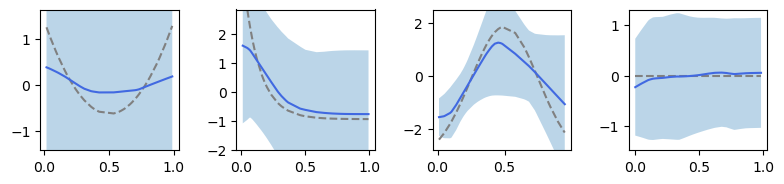

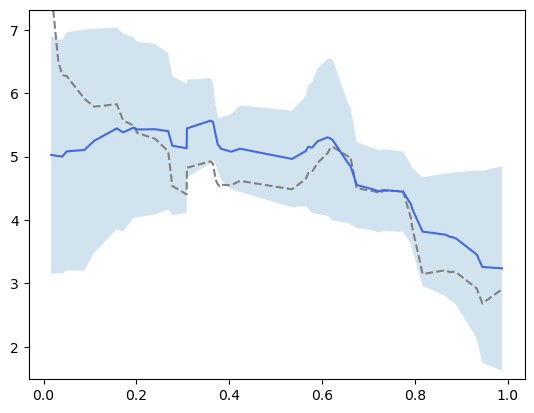

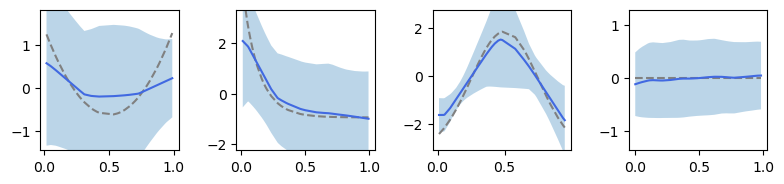

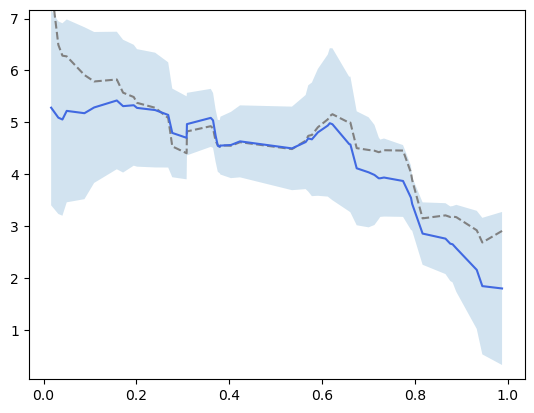

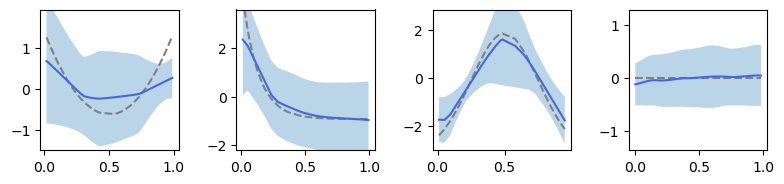

...

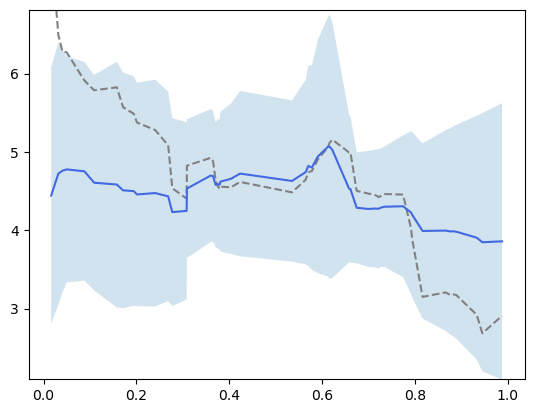

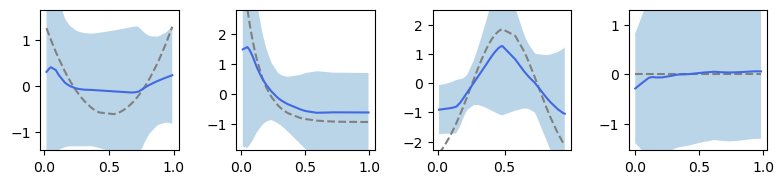

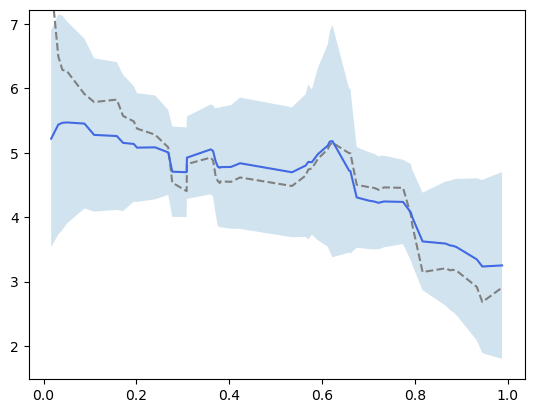

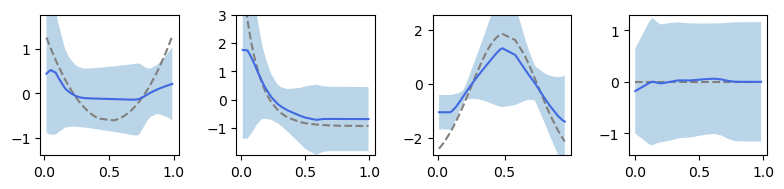

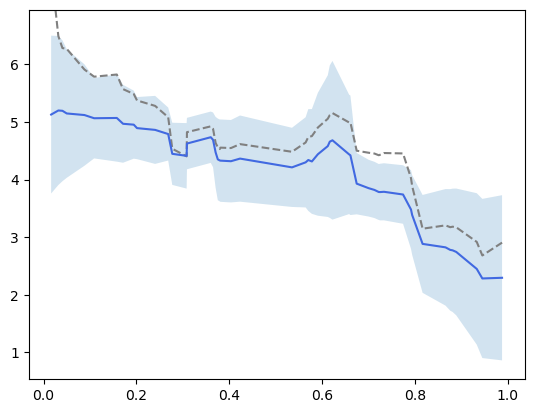

In [26]:
wandb.agent(sweep_id, 
            function=partial(train, 
                             config=cfg, 
                             dataloader_train=train_loader, 
                             dataloader_val=val_loader, 
                             testset=testset,
                             ensemble=True, 
                             use_wandb=True))